# Limpeza de dados

## Configuração

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go

In [2]:
pio.renderers.default = 'svg'
pio.templates.default = "ggplot2"
px.defaults.width = 800
px.defaults.height = 600

pxconfig = {'staticPlot': True}

## Iniciando com a base de dados de 2022

In [3]:
# Checa informações de encoding da base de dados
import chardet

with open('../dados/brutos/despesa_ceaps_2022.csv', 'rb') as rawdata:
    result = chardet.detect(rawdata.read(100000))
result

{'encoding': 'ISO-8859-1', 'confidence': 0.73, 'language': ''}

In [4]:
df_2022 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2022.csv', encoding='ISO-8859-1', sep=';', header=1, parse_dates=['DATA'], infer_datetime_format=True, dayfirst=True) # Configura parâmetros necessárias pra ler o csv corretamente


# transforma valores para o tipo desejado que permita a manipulação
df_2022['VALOR_REEMBOLSADO'] = df_2022['VALOR_REEMBOLSADO'].str.replace(",", ".").astype('float64')
df_2022['TIPO_DESPESA'] = df_2022['TIPO_DESPESA'].astype('string')
df_2022['DETALHAMENTO'] = df_2022['DETALHAMENTO'].astype('string')
df_2022['SENADOR'] = df_2022['SENADOR'].str.title() # Muda todas as palavras para iniciar com maísculo
df_2022.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6160 entries, 0 to 6159
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   ANO                6160 non-null   int64         
 1   MES                6160 non-null   int64         
 2   SENADOR            6160 non-null   object        
 3   TIPO_DESPESA       6160 non-null   string        
 4   CNPJ_CPF           6160 non-null   object        
 5   FORNECEDOR         6160 non-null   object        
 6   DOCUMENTO          5858 non-null   object        
 7   DATA               6160 non-null   datetime64[ns]
 8   DETALHAMENTO       3308 non-null   string        
 9   VALOR_REEMBOLSADO  6160 non-null   float64       
 10  COD_DOCUMENTO      6160 non-null   int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(4), string(2)
memory usage: 529.5+ KB


In [5]:
df_2022.sample(20)

,ANO,MES,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO
3839,2022,5,Mara Gabrilli,"Aluguel de imóveis para escritório político, c...",61.695.227/0001-93,ELETROPAULO METROPOLITANA ELETRICIDADE DE SAO ...,408096103,2022-05-02,Despesa referente a energia elétrica em uso no...,144.25,2180291
422,2022,2,Carlos Portinho,"Contratação de consultorias, assessorias, pesq...",17.825.931/0001-21,felipe cezar dos santos de oliveira,00000015,2022-02-03,atualização de pagina e integração com automaç...,230.00,2173995
6060,2022,3,Zequinha Marinho,Aquisição de material de consumo para uso no e...,08.672.139/0001-93,C2A SEVIÇOS EM TECNOLOGIA DA INFORMATICA EIRELI,00008193,2022-03-30,<NA>,475.00,2177322
348,2022,2,Carlos Fávaro,"Locomoção, hospedagem, alimentação, combustíve...",12.959.002/0001-91,SLIM HOTÉIS (K. MARTINS EMPREENDIMENTOS E INVE...,120422,2022-02-08,<NA>,1379.70,2174296
236,2022,3,Alvaro Dias,"Passagens aéreas, aquáticas e terrestres nacio...",16.978.175/0001-08,Ádria Viagens e Turismo,HPZVTG,2022-03-08,"Companhia Aérea: LATAM, Localizador: HPZVTG. P...",1091.32,2176110
1645,2022,1,Fabiano Contarato,"Locomoção, hospedagem, alimentação, combustíve...",27.809.490/0001-28,POSTO VENTURA QUARTO LTDA,146473,2022-01-06,DESPESA COM COMBUSTÍVEL,182.41,2174763
3830,2022,4,Mara Gabrilli,Aquisição de material de consumo para uso no e...,02.351.877/0001-52,LOCAWEB SERVIÇOS DE INTERNET SA,06115033,2022-04-27,Despesa referente a locação de software para u...,62.41,2179220
3345,2022,2,Lasier Martins,"Passagens aéreas, aquáticas e terrestres nacio...",33.937.681/0001-78,LATAM,QSAKEI,2022-01-28,"Companhia Aérea: LATAM, Localizador: QSAKEI. P...",423.23,2175265
5442,2022,5,Soraya Thronicke,"Locomoção, hospedagem, alimentação, combustíve...",19.046.218/0021-59,Decio Com. E. Serv. Rod. Ltda Rio Verde Posto,661104,2022-05-11,<NA>,220.03,2180077
3143,2022,3,Jorginho Mello,"Locomoção, hospedagem, alimentação, combustíve...",83.864.819/0002-05,Pousatur Pousadas Hot Tur Ltda,152800,2022-03-12,<NA>,270.90,2176912


In [6]:
df_2022['TIPO_DESPESA'].unique()

<StringArray>
[                                                                                                       'Aluguel de imóveis para escritório político, compreendendo despesas concernentes a eles.',
                                                                                                                                                             'Divulgação da atividade parlamentar',
                                                                                                                                              'Passagens aéreas, aquáticas e terrestres nacionais',
                                                          'Contratação de consultorias, assessorias, pesquisas, trabalhos técnicos e outros serviços de apoio ao exercício do mandato parlamentar',
                                                                                                                                'Locomoção, hospedagem, alimentação, combustíveis e lubrificantes',
 'Aqui

In [7]:
# # Existe um padrão na string de detalhamento de passagens aéreas que me permite coletar a informação da companhia aérea de cada passagem.

# mask = (df_2022['TIPO_DESPESA'] == 'Passagens aéreas, aquáticas e terrestres nacionais') & (df_2022['DETALHAMENTO'].str.contains("Aérea", case=False)) # Checa se é passagem aérea
# df_companhias_aereas = df_2022[mask]

# companhias = df_companhias_aereas.loc[:,'DETALHAMENTO'].str.split(",", expand=True)
# companhias = companhias[0].str.split(": ", expand=True)
# companhias = companhias[1]
# df_companhias_aereas = df_companhias_aereas.assign(COMPANHIA_AÉREA = companhias) # Assign foi usado para evitar o o 'SettingWithCopyWarning'
# df_companhias_aereas

# df_companhias_aereas['COMPANHIA_AÉREA'] = df_companhias_aereas.loc[:,'DETALHAMENTO'].str.split(",", expand=True)[0].str.split(": ", expand=True)[1] # Separa e seleciona apenas o nome da companhia
# df_companhias_aereas.loc[:,'COMPANHIA_AÉREA'] = df_companhias_aereas.loc[:,'COMPANHIA_AÉREA'].apply(lambda x : "LATAM" if (x == "TAM") else (x)) # Junta TAM e LATAM



In [8]:
df_2022.describe(include='all')

C:\Users\Bruno\AppData\Local\Temp\ipykernel_13368\720736434.py:1: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.



,ANO,MES,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO
count,6160.0,6160.000000,6160,6160,6160,6160,5858,6160,3308,6160.00000,6.160000e+03
unique,NaN,NaN,82,7,1716,1828,5343,185,2107,NaN,NaN
top,NaN,NaN,Humberto Costa,"Locomoção, hospedagem, alimentação, combustíve...",16.978.175/0001-08,ADRIA VIAGENS E TURISMO LTDA,s/n,2022-02-01 00:00:00,DESPESA COM COMBUSTÍVEL EM VEÍCULOS UTILIZADOS...,NaN,NaN
freq,NaN,NaN,215,2351,433,235,25,107,131,NaN,NaN
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2002-02-02 00:00:00,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-05-28 00:00:00,NaN,NaN,NaN
mean,2022.0,2.850487,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1559.44525,2.177022e+06
std,0.0,1.219217,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2896.67947,2.195340e+03
min,2022.0,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01000,2.172906e+06
25%,2022.0,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,200.15000,2.175224e+06


In [9]:
df_2022['TIPO_DESPESA'].value_counts()

Locomoção, hospedagem, alimentação, combustíve...    2351
Passagens aéreas, aquáticas e terrestres nacio...    1242
Aluguel de imóveis para escritório político, c...    1204
Divulgação da atividade parlamentar                   478
Aquisição de material de consumo para uso no e...     442
Contratação de consultorias, assessorias, pesq...     435
Serviços de Segurança Privada                           8
Name: TIPO_DESPESA, dtype: Int64

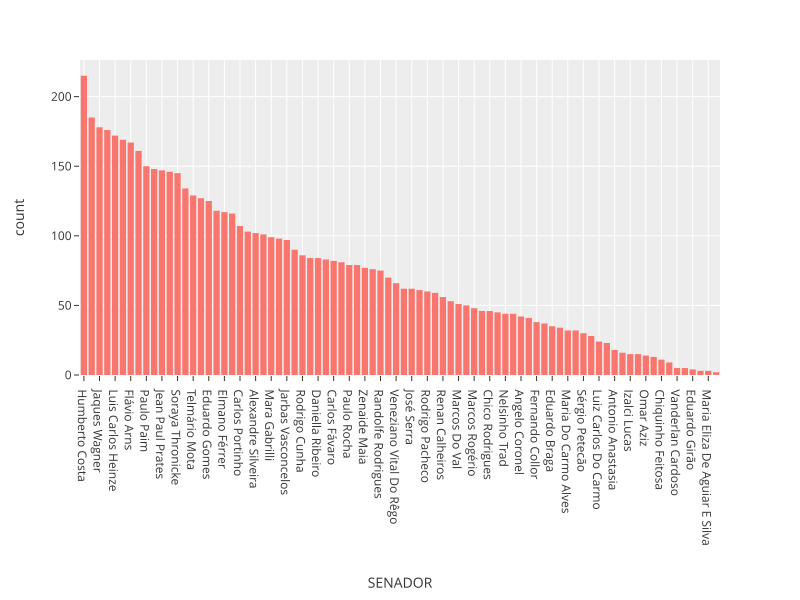

In [10]:
# Gráfico leva em consideração a quantidade de despesas e não o valor total acumlado
fig = px.histogram(df_2022, x='SENADOR').update_xaxes(categoryorder="total descending")
fig.show(config=pxconfig)

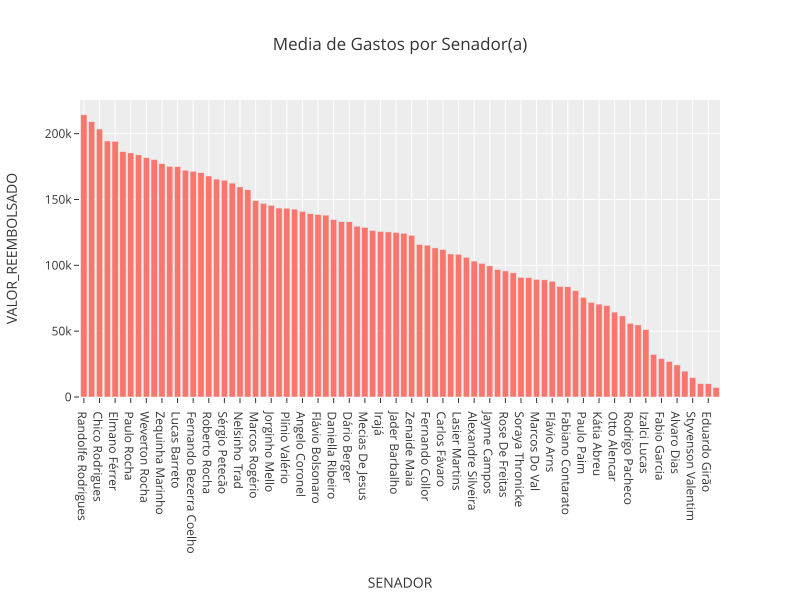

In [11]:
df_2022_valor_medio_senador = df_2022.groupby(['SENADOR']).sum()
df_2022_valor_medio_senador
fig = px.bar(df_2022_valor_medio_senador, x=df_2022_valor_medio_senador.index, y='VALOR_REEMBOLSADO', title="Media de Gastos por Senador(a)")
fig.update_xaxes(categoryorder="total descending")
fig.show(config=pxconfig)

## Combinando os dados de 2011 a 2022



In [12]:
# lê novamente a base de 2022 pra juntar as bases brutas e fazer toda a limpeza na base já mesclada
df_2022 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2022.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2021 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2021.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2020 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2020.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2019 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2019.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2018 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2018.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2017 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2017.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2016 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2016.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2015 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2015.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2014 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2014.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2013 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2013.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2012 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2012.csv', encoding='ISO-8859-1', sep=';', header=1)
df_2011 = pd.read_csv(filepath_or_buffer = '../dados/brutos/despesa_ceaps_2011.csv', encoding='ISO-8859-1', sep=';', header=1)



# junta todas as bases
df_total = pd.concat([df_2022, df_2021, df_2020, df_2019, df_2018, df_2017, df_2016, df_2015, df_2014, df_2013, df_2012, df_2011], ignore_index=True)

# transforma valores para o tipo desejado que permita a manipulação
df_total['VALOR_REEMBOLSADO'] = df_total['VALOR_REEMBOLSADO'].str.replace(",", ".")
df_total['VALOR_REEMBOLSADO'] = df_total['VALOR_REEMBOLSADO'].str.replace("1\r\n", "") # foi encontrado 1 item com erro no preenchimento e esse replace é específico pra esse valor
df_total['VALOR_REEMBOLSADO'] = df_total['VALOR_REEMBOLSADO'].astype('float64')
df_total['TIPO_DESPESA'] = df_total['TIPO_DESPESA'].astype('string')
df_total['DETALHAMENTO'] = df_total['DETALHAMENTO'].astype('string')
df_total['SENADOR'] = df_total['SENADOR'].str.title() # Muda todas as palavras para iniciar com maísculo
df_total['DATA'] = pd.to_datetime(df_total['DATA'], infer_datetime_format=True, dayfirst=True, errors='coerce')
df_total.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 270177 entries, 0 to 270176
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ANO                270177 non-null  int64         
 1   MES                270177 non-null  int64         
 2   SENADOR            270177 non-null  object        
 3   TIPO_DESPESA       270177 non-null  string        
 4   CNPJ_CPF           270177 non-null  object        
 5   FORNECEDOR         270177 non-null  object        
 6   DOCUMENTO          251637 non-null  object        
 7   DATA               270154 non-null  datetime64[ns]
 8   DETALHAMENTO       174877 non-null  string        
 9   VALOR_REEMBOLSADO  270177 non-null  float64       
 10  COD_DOCUMENTO      270175 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(2), object(4), string(2)
memory usage: 22.7+ MB


In [13]:
df_total['DATA'].dt.year.unique()

array([2022., 2021., 2019., 2020., 2002.,   nan, 2010., 2014., 2018.,
       2009., 2016., 2017., 1957., 2001., 2011., 2013., 2012., 2107.,
       2015., 2101., 2106., 1977., 1986., 2105., 2041., 2007., 1956.,
       1962., 2023., 2003., 1965., 2004., 1980., 1901.])

In [14]:
### Ver se isso ainda é necessário ###

df_total = df_total[(df_total['DATA'].dt.year >= 2011) & (df_total['DATA'].dt.year <= 2022)]
df_total['DATA'].dt.year.unique()

array([2022, 2021, 2019, 2020, 2014, 2018, 2016, 2017, 2011, 2013, 2012,
       2015], dtype=int64)

In [15]:
df_total.shape

(270058, 11)

In [16]:
df_total['VALOR_REEMBOLSADO'].nlargest(10)

87919     270000.0
114861    256980.0
141426    216780.0
179875    162400.0
178251    150000.0
159140    134100.0
36249     120000.0
79936     103900.0
80199     102000.0
80202     102000.0
Name: VALOR_REEMBOLSADO, dtype: float64

In [17]:
df_total.duplicated().value_counts()

False    270058
dtype: int64

### Separando o nome das companhias aéreas com base no detalhamento e no fornecedor

- Selecionando apenas pelo tipo de despesa com passagens e filtrando pelo nome das principais companhias aéres

In [18]:
mask1 = df_total['TIPO_DESPESA'] == 'Passagens aéreas, aquáticas e terrestres nacionais'
df_companhias_aereas = df_total.loc[mask1]
lista_companhias = ['LATAM', 'TAM', ' GOL', ' AZUL', 'PASSAREDO', 'ITAPEMIRIM', 'AVIANCA', 'TAF', 'ABAETÉ']
df_companhias_aereas['DETALHAMENTO'].str.contains('|'.join(lista_companhias), case=False).value_counts()

True     40884
False    25423
Name: DETALHAMENTO, dtype: Int64

- Filtrando se o nome das companhias está presente ou em detalhamento ou em fornecedor

In [19]:
mask_2 = df_companhias_aereas['DETALHAMENTO'].str.contains('|'.join(lista_companhias), case=False)
mask_3 = df_companhias_aereas['FORNECEDOR'].str.contains('|'.join(lista_companhias), case=False)
df_companhias_aereas = df_companhias_aereas.loc[(mask_2 | mask_3)]
df_companhias_aereas.shape

(57101, 11)

In [20]:
# def separa_companhia_aerea(df_serie, lista):
#     resultado = []
#     for item in lista:
#         for item2 in df_serie:
#             if pd.isna(item2):
#                 resultado.append('Sem Informação')
#             else:
#                 if item.casefold() in item2.casefold():
#                     resultado.append(item)
#     return resultado

def separa_companhia_aerea(df_serie, lista):
    resultado = []
    for item2 in df_serie:
        if pd.isna(item2):
            resultado.append('Sem Informação')
        else:
            count = 0
            for item in lista:                
                if item.casefold() in item2.casefold():
                    resultado.append(item)
                    count = count + 1                    
                if count > 0:
                    break
            if count == 0:
                resultado.append('Sem Informação')
    return resultado

nova_coluna= separa_companhia_aerea(df_companhias_aereas['DETALHAMENTO'], lista_companhias)
df_companhias_aereas['COMPANHIA_AEREA'] = nova_coluna
df_companhias_aereas['COMPANHIA_AEREA'].value_counts()

Sem Informação    16217
LATAM             12781
 GOL              11356
TAM                6535
AVIANCA            5846
 AZUL              4136
PASSAREDO           220
ITAPEMIRIM            7
TAF                   2
ABAETÉ                1
Name: COMPANHIA_AEREA, dtype: int64

In [21]:
df_companhias_aereas['COMPANHIA_AEREA']

5                  LATAM
15                   GOL
16                 LATAM
17                 LATAM
18                   GOL
               ...      
270116    Sem Informação
270173    Sem Informação
270174    Sem Informação
270175    Sem Informação
270176    Sem Informação
Name: COMPANHIA_AEREA, Length: 57101, dtype: object

In [22]:
# Junta a coluna das companhias aéreas com o df completo
# Preenche os valore nulos com "Outras despesas"

df_total_com_companhias = df_total.join(df_companhias_aereas['COMPANHIA_AEREA'])
# df_total.rename(columns={0: 'COMPANHIA_AÉREA'}, inplace=True)
df_total_com_companhias['COMPANHIA_AEREA'].fillna('Outras despesas', inplace=True)
df_total_com_companhias['COMPANHIA_AEREA'].value_counts()
df_total_com_companhias['COMPANHIA_AEREA'].replace('TAM', 'TAM/LATAM', inplace=True)
df_total_com_companhias['COMPANHIA_AEREA'].replace('LATAM', 'TAM/LATAM', inplace=True)

df_total_com_companhias['COMPANHIA_AEREA'].value_counts()
df_total_com_companhias


,ANO,MES,SENADOR,TIPO_DESPESA,CNPJ_CPF,FORNECEDOR,DOCUMENTO,DATA,DETALHAMENTO,VALOR_REEMBOLSADO,COD_DOCUMENTO,COMPANHIA_AEREA
0,2022,1,Acir Gurgacz,"Aluguel de imóveis para escritório político, c...",004.948.028-63,GILBERTO PISELO DO NASCIMENTO,001/22,2022-01-03,Despesa com pagamento de aluguel de imóvel par...,6000.00,2173614.0,Outras despesas
1,2022,1,Acir Gurgacz,Divulgação da atividade parlamentar,26.320.603/0001-64,INFORMANAHORA,000000000000310/A,2022-01-04,Despesa com divulgação da atividade parlamenta...,1500.00,2173615.0,Outras despesas
2,2022,1,Acir Gurgacz,Divulgação da atividade parlamentar,13.659.201/0001-47,LINHA PURPURA FOTO E VIDEO LTDA,107,2022-01-14,Despesa com produção de texto e edição de víde...,6000.00,2173616.0,Outras despesas
3,2022,1,Acir Gurgacz,Divulgação da atividade parlamentar,23.652.846/0001-01,ROBERTO GUTIERREZ DA ROCHA M.E.I.,187,2022-01-18,Divulgação da atividade parlamentar,1000.00,2173618.0,Outras despesas
4,2022,1,Acir Gurgacz,Divulgação da atividade parlamentar,08.941.827/0001-01,RONDONIA DINÂMICA COM. E SERV. DE INFORMÁTICA ...,000000000001772/A,2022-01-17,Divulgação da atividade parlamentar,2000.00,2173617.0,Outras despesas
...,...,...,...,...,...,...,...,...,...,...,...,...
270172,2011,12,Zezé Perrella,"Passagens aéreas, aquáticas e terrestres nacio...",21.150.875/0001-40,Primus Turismo e Viagens Ltda,2011/29034,2011-12-12,Referente ao pagamento de passagens no trecho ...,821.34,476435.0,Outras despesas
270173,2011,12,Zezé Perrella,"Passagens aéreas, aquáticas e terrestres nacio...",02.012.862/0001-60,TAM,4244,2011-12-21,Passagem aérea no trecho Brasília/Belo Horizon...,412.26,507477.0,Sem Informação
270174,2011,12,Zezé Perrella,"Passagens aéreas, aquáticas e terrestres nacio...",02.012.862/0001-60,Tam,s/nº,2011-12-16,Passagem aérea no trecho Belo Horizonte/Brasíl...,454.12,507476.0,Sem Informação
270175,2011,12,Zezé Perrella,"Passagens aéreas, aquáticas e terrestres nacio...",02.012.862/0001-60,TAM - Comércio Agência de Viagens Ltda,3OE4EH,2011-12-08,Senador José Perrella Valor referente aos bilh...,1041.25,476433.0,Sem Informação


In [23]:
df_total_com_companhias.duplicated().value_counts()

False    270058
dtype: int64

In [24]:
df_total_com_companhias.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 270058 entries, 0 to 270176
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ANO                270058 non-null  int64         
 1   MES                270058 non-null  int64         
 2   SENADOR            270058 non-null  object        
 3   TIPO_DESPESA       270058 non-null  string        
 4   CNPJ_CPF           270058 non-null  object        
 5   FORNECEDOR         270058 non-null  object        
 6   DOCUMENTO          251527 non-null  object        
 7   DATA               270058 non-null  datetime64[ns]
 8   DETALHAMENTO       174811 non-null  string        
 9   VALOR_REEMBOLSADO  270058 non-null  float64       
 10  COD_DOCUMENTO      270058 non-null  float64       
 11  COMPANHIA_AEREA    270058 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(5), string(2)
memory usage: 34.8+ MB


In [25]:
# Muda os dtypes para tipos mais convenientes e diminui o uso de memória da base de dados

df_total_com_companhias['TIPO_DESPESA'] = df_total_com_companhias['TIPO_DESPESA'].astype('category')
df_total_com_companhias['COMPANHIA_AEREA'] = df_total_com_companhias['COMPANHIA_AEREA'].astype('category')
df_total_com_companhias['ANO'] = df_total_com_companhias['ANO'].astype('int16')
df_total_com_companhias['MES'] = df_total_com_companhias['MES'].astype('int8')
df_total_com_companhias.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 270058 entries, 0 to 270176
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ANO                270058 non-null  int16         
 1   MES                270058 non-null  int8          
 2   SENADOR            270058 non-null  object        
 3   TIPO_DESPESA       270058 non-null  category      
 4   CNPJ_CPF           270058 non-null  object        
 5   FORNECEDOR         270058 non-null  object        
 6   DOCUMENTO          251527 non-null  object        
 7   DATA               270058 non-null  datetime64[ns]
 8   DETALHAMENTO       174811 non-null  string        
 9   VALOR_REEMBOLSADO  270058 non-null  float64       
 10  COD_DOCUMENTO      270058 non-null  float64       
 11  COMPANHIA_AEREA    270058 non-null  category      
dtypes: category(2), datetime64[ns](1), float64(2), int16(1), int8(1), object(4), string(1)
memory usage:

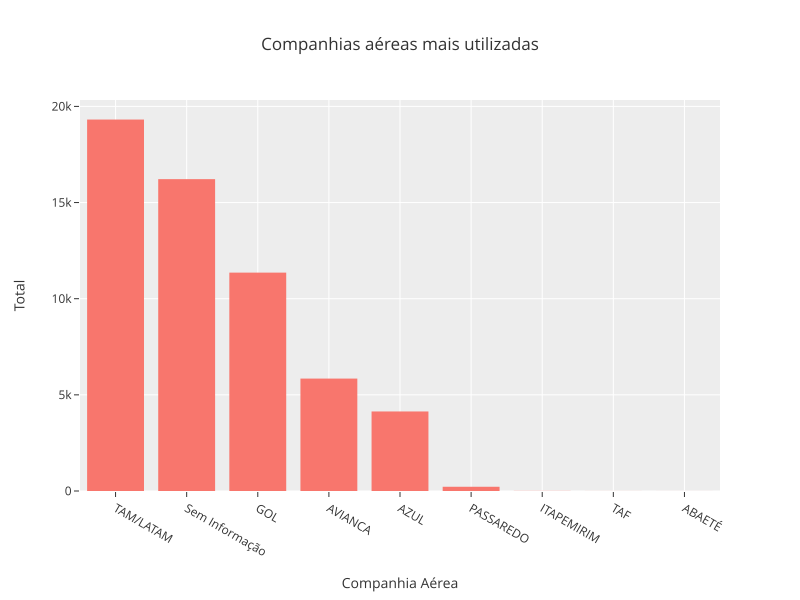

In [26]:
somente_aereas = df_total_com_companhias.loc[df_total_com_companhias['COMPANHIA_AEREA'] != 'Outras despesas'].copy()
somente_aereas['COMPANHIA_AEREA'].value_counts()
fig = px.histogram(somente_aereas, x='COMPANHIA_AEREA', title='Companhias aéreas mais utilizadas')
fig.update_xaxes(categoryorder="total descending", title="Companhia Aérea")
fig.update_yaxes(title="Total")
fig.show(config=pxconfig)

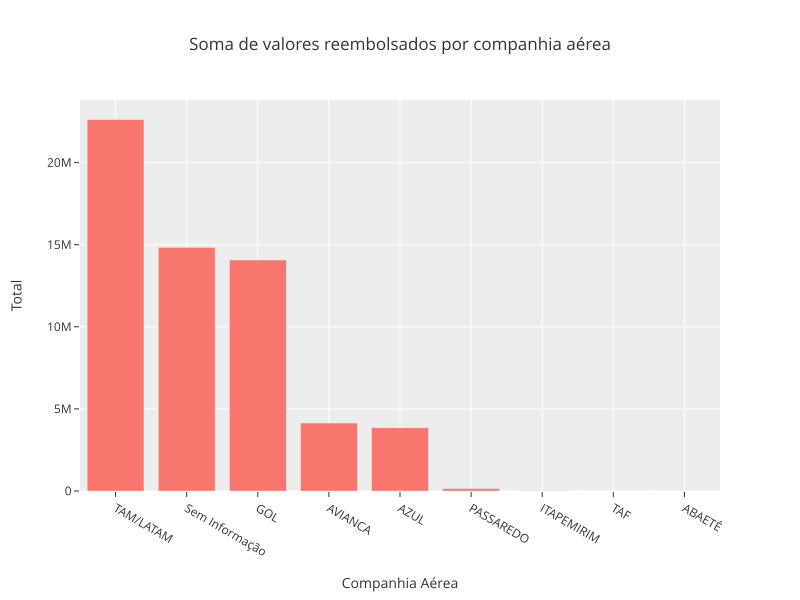

In [27]:
somente_aereas['COMPANHIA_AEREA'].value_counts()
gastos_por_companhia = somente_aereas.groupby('COMPANHIA_AEREA').sum()
gastos_por_companhia.reset_index(inplace=True)
gastos_por_companhia = gastos_por_companhia.loc[gastos_por_companhia['VALOR_REEMBOLSADO'] > 0]
gastos_por_companhia

fig = px.bar(gastos_por_companhia, x='COMPANHIA_AEREA', y='VALOR_REEMBOLSADO', title='Soma de valores reembolsados por companhia aérea')
fig.update_xaxes(categoryorder="total descending", title="Companhia Aérea")
fig.update_yaxes(title="Total")
fig.show(config=pxconfig)


## Valores reembolsados por Senador(a)

In [28]:
fig = px.box(df_total_com_companhias, x='VALOR_REEMBOLSADO', title='Distribuição dos valores e discrepâncias', width=1500)
fig.show(config=pxconfig)

Nesse gráfico é possível perceber a presença de valores negativos.
Como só existem 3 valores negativo, é possível deduzir que se trata de um erro. Portanto esses valores serão positivados.

In [29]:
df_total_com_companhias.loc[:,'VALOR_REEMBOLSADO'] = df_total_com_companhias.loc[:,'VALOR_REEMBOLSADO'].apply(lambda x : x*(-1) if x < 0 else x)
df_total_com_companhias.loc[df_total_com_companhias['VALOR_REEMBOLSADO'] < 0].shape

(0, 12)

In [30]:
fig = px.box(df_total_com_companhias, x='VALOR_REEMBOLSADO', title='Distribuição dos valores e discrepâncias', width=1500)
fig.show(config=pxconfig)

In [31]:
len(df_total_com_companhias['SENADOR'].unique())

250

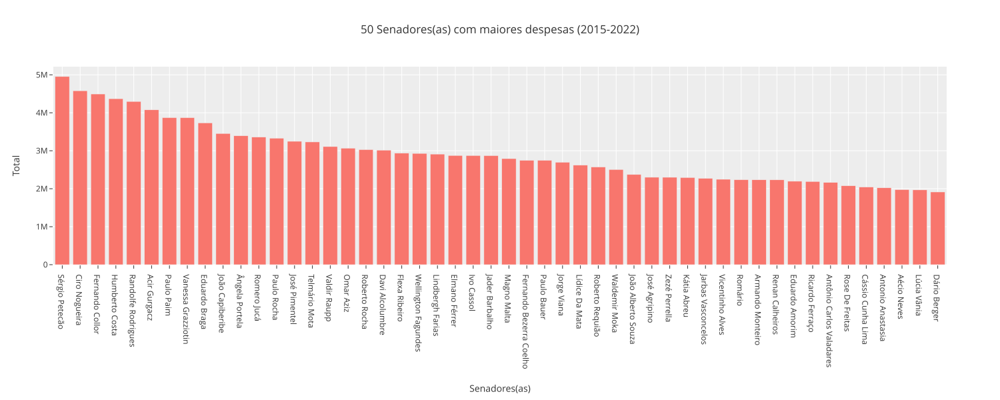

In [32]:
somatorio_despesas = df_total_com_companhias.groupby('SENADOR').sum()
somatorio_despesas.reset_index(inplace=True)
top50 = somatorio_despesas.loc[somatorio_despesas['VALOR_REEMBOLSADO'].isin(somatorio_despesas['VALOR_REEMBOLSADO'].nlargest(50))]


fig = px.bar(top50, x='SENADOR', y='VALOR_REEMBOLSADO', title='50 Senadores(as) com maiores despesas (2015-2022)', width=1500)
fig.update_xaxes(title = 'Senadores(as)', categoryorder = 'total descending')
fig.update_yaxes(title = 'Total')
fig.show(config=pxconfig)

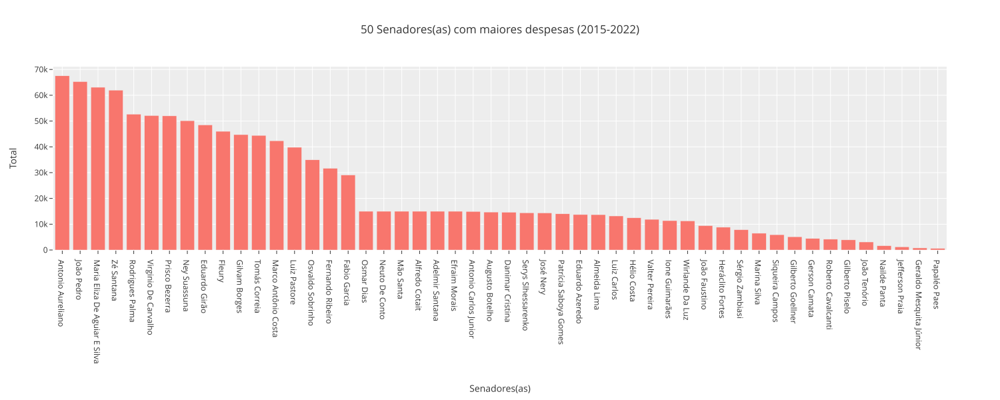

In [33]:
somatorio_despesas = df_total_com_companhias.groupby('SENADOR').sum()
somatorio_despesas.reset_index(inplace=True)
bottom50 = somatorio_despesas.loc[somatorio_despesas['VALOR_REEMBOLSADO'].isin(somatorio_despesas['VALOR_REEMBOLSADO'].nsmallest(50))]


fig = px.bar(bottom50, x='SENADOR', y='VALOR_REEMBOLSADO', title='50 Senadores(as) com maiores despesas (2015-2022)', width=1500)
fig.update_xaxes(title = 'Senadores(as)', categoryorder = 'total descending')
fig.update_yaxes(title = 'Total')
fig.show(config=pxconfig)

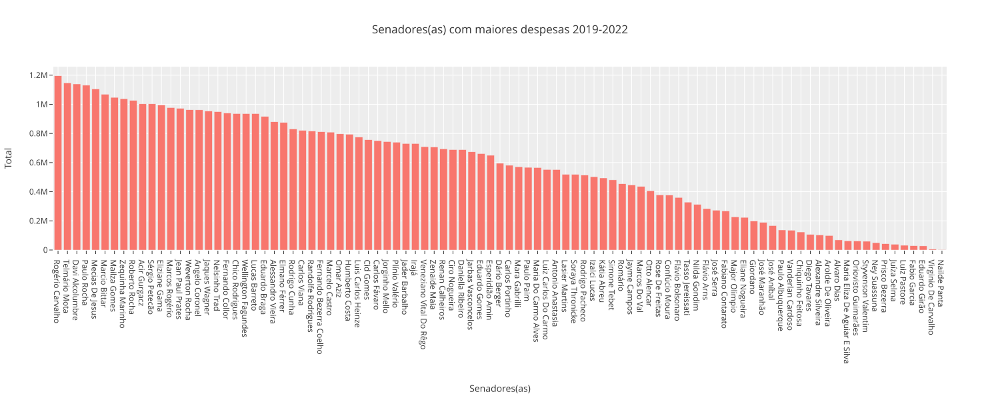

In [34]:
df_2019_2022 = df_total_com_companhias.loc[df_total_com_companhias['ANO'] > 2019]
maiores_gastos_senador_2019 = df_2019_2022.groupby('SENADOR').sum()
maiores_gastos_senador_2019.reset_index(inplace=True)

fig = px.bar(maiores_gastos_senador_2019, x='SENADOR', y='VALOR_REEMBOLSADO', title='Senadores(as) com maiores despesas 2019-2022', width=1500)
fig.update_xaxes(title = 'Senadores(as)', categoryorder = 'total descending')
fig.update_yaxes(title = 'Total')
fig.show(config=pxconfig)

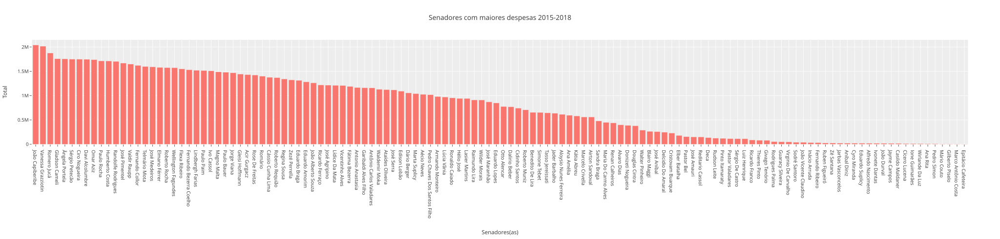

In [35]:
mask = (df_total_com_companhias['ANO'] >= 2015) & (df_total_com_companhias['ANO'] <= 2018)
df_2015_2018 = df_total_com_companhias.loc[mask]
maiores_gastos_senador_2015 = df_2015_2018.groupby('SENADOR').sum()
maiores_gastos_senador_2015.reset_index(inplace=True)

fig = px.bar(maiores_gastos_senador_2015, x='SENADOR', y='VALOR_REEMBOLSADO', title='Senadores com maiores despesas 2015-2018', width=2500)
fig.update_xaxes(title = 'Senadores(as)', categoryorder = 'total descending')
fig.update_yaxes(title = 'Total')
fig.show(config=pxconfig)

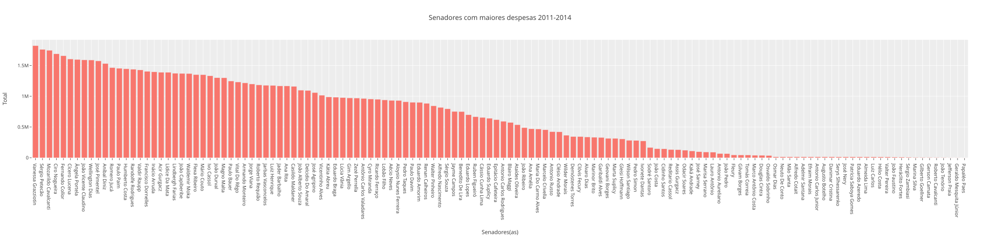

In [36]:
mask = (df_total_com_companhias['ANO'] >= 2011) & (df_total_com_companhias['ANO'] <= 2014)
df_2011_2014 = df_total_com_companhias.loc[mask]
maiores_gastos_senador_2015 = df_2011_2014.groupby('SENADOR').sum()
maiores_gastos_senador_2015.reset_index(inplace=True)

fig = px.bar(maiores_gastos_senador_2015, x='SENADOR', y='VALOR_REEMBOLSADO', title='Senadores com maiores despesas 2011-2014', width=2500)
fig.update_xaxes(title = 'Senadores(as)', categoryorder = 'total descending')
fig.update_yaxes(title = 'Total')
fig.show(config=pxconfig)

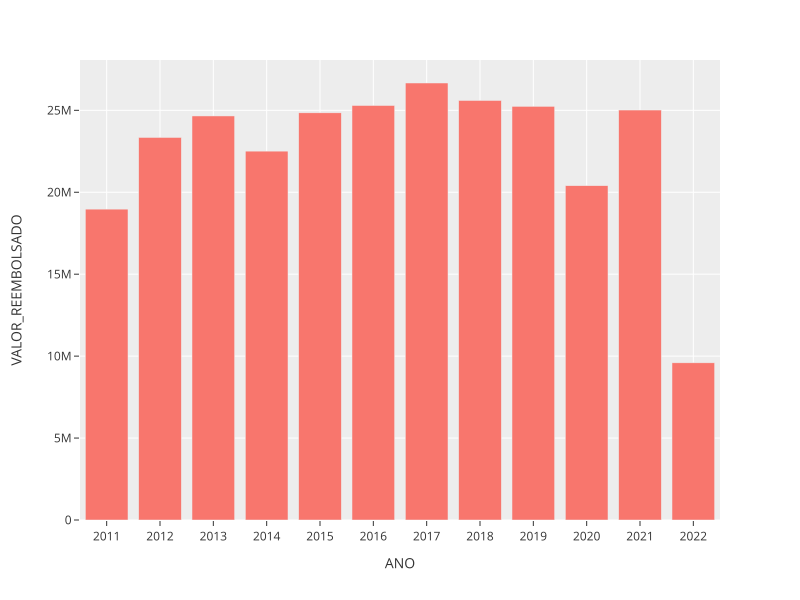

In [37]:
total_gastos_por_ano = df_total_com_companhias.groupby('ANO')['VALOR_REEMBOLSADO'].sum()
total_gastos_por_ano = total_gastos_por_ano.to_frame()
total_gastos_por_ano.reset_index(inplace=True)
total_gastos_por_ano

fig = px.bar(total_gastos_por_ano, x='ANO', y='VALOR_REEMBOLSADO')
fig.update_xaxes(tickmode='linear')
fig.show(config=pxconfig)

## Transformando dados em série temporaral para Machine Learning

In [38]:
df_total_com_companhias['DATA'].isna().value_counts()
df_despesa_data = df_total.loc[:,['DATA', 'VALOR_REEMBOLSADO']].copy()

In [39]:
df_despesa_data.dropna(inplace=True)
df_despesa_data['DATA'].isna().value_counts()

False    270058
Name: DATA, dtype: int64

In [40]:
df_despesa_data.info()
df_despesa_data['DATA'].dt.year.value_counts()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 270058 entries, 0 to 270176
Data columns (total 2 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   DATA               270058 non-null  datetime64[ns]
 1   VALOR_REEMBOLSADO  270058 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 14.2 MB


2012    30215
2013    29290
2017    27111
2016    26786
2015    26003
2011    25513
2018    24399
2014    22009
2019    21680
2021    16843
2020    14002
2022     6207
Name: DATA, dtype: int64

In [41]:
df_despesa_data.sort_values(by='DATA', inplace=True)
df_despesa_data['DATA']

250623   2011-01-01
244614   2011-01-01
260615   2011-01-01
260588   2011-01-01
261897   2011-01-01
            ...    
1469     2022-05-28
10578    2022-07-21
9938     2022-10-19
257179   2022-11-19
22397    2022-12-27
Name: DATA, Length: 270058, dtype: datetime64[ns]

In [42]:
df_despesa_data = df_despesa_data.groupby(df_despesa_data['DATA'])['VALOR_REEMBOLSADO'].sum().reset_index()
df_despesa_data

,DATA,VALOR_REEMBOLSADO
0,2011-01-01,4680.17
1,2011-01-02,3097.27
2,2011-01-03,7061.41
3,2011-01-04,5603.73
4,2011-01-05,27491.16
...,...,...
4163,2022-05-28,2785.91
4164,2022-07-21,518.14
4165,2022-10-19,127.00
4166,2022-11-19,875.96


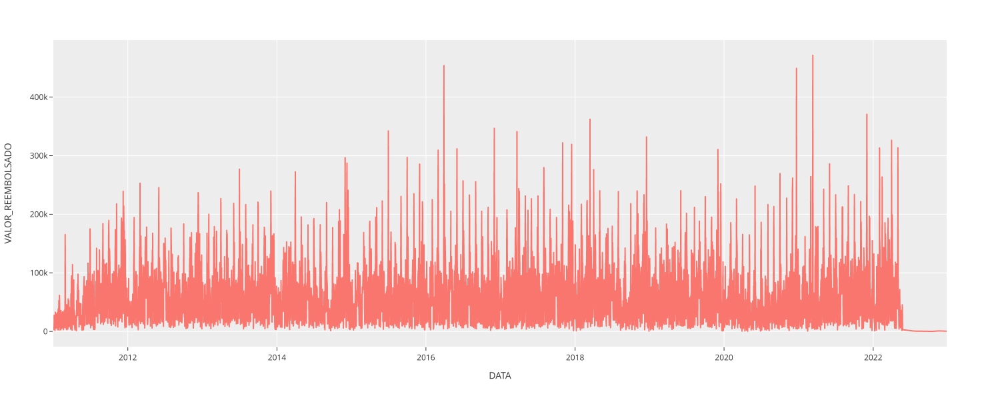

In [43]:
fig = px.line(df_despesa_data, x='DATA', y='VALOR_REEMBOLSADO', width=1500)
fig.show(config=pxconfig)

### Exportanto a base de dados

Esse conjunto de dados será utilizado em outro notebook sobre Machine Learning e previsão

In [44]:
df_despesa_data.to_csv('../dados/trabalhados/gastos_serie_temporal.csv')